In [60]:
# working_directory = "/Users/kemalinecik/git_nosync/sctram"
working_directory = "/home/icb/kemal.inecik/work/codes/sctram"

In [2]:
import sys

sys.path.append(working_directory)

import logging
import os

import anndata as ad
import networkx as nx
import numpy as np
import pandas as pd
import scanpy as sc
from sctram.evaluate._adjacency import AdjacencyMatrixEvaluation
from sctram.infer._paga import PAGAInference
from sctram.input import read_dict

sc.settings.verbosity = 3

In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import pickle

import matplotlib.pyplot as plt
import seaborn as sns

_rcparams_path = os.path.join(working_directory, "reproducibility/figure_rcparams/rcparams.pickle")
with open(_rcparams_path, "rb") as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [182]:
dataset_dir = "/home/icb/kemal.inecik/lustre_workspace/hdca/temp/models"
dataset_name = "20240613_152640100145_gpusrv44.scidom.de_2367215_unification_union_20241216_hvg-intersection_integration_latent.h5ad"
adata = ad.read_h5ad(os.path.join(dataset_dir, dataset_name))
adata

AnnData object with n_obs × n_vars = 3652086 × 28
    obs: 'handle_anndata', 'study', 'sample_ID', 'organ', 'age', 'cell_type', 'lane_ID', 'author_batch', 'institute', 'study_PI', 'doi', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'anatomical_region', 'anatomical_region_level_2', 'sex', 'sex_inferred', 'subject_type', 'sample_status', 'sample_cultured', 'protocol_tissue_dissociation', 'cell_enrichment', 'library_platform', 'strand_sequence', 'sequencing_platform', 'reads_processing', 'biological_unit', 'reference_genome', 'reference_genome_ensembl_release', 'concatenated_integration_covariates', 'original_author_annotation', 'LVL3', 'LVL2', 'LVL1', 'LVL0', '_scvi_batch', '_scvi_labels', 'split'

In [183]:
adata = adata[adata.obs["LVL1"].isin(["Musculoskeletal_cells"])]

In [188]:
adata = adata[[not i.startswith("ten") and not i.startswith("per") for i in adata.obs["cell_type"].str.lower()]]

In [189]:
sc.pp.neighbors(adata, n_neighbors=30)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)


In [190]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:27)


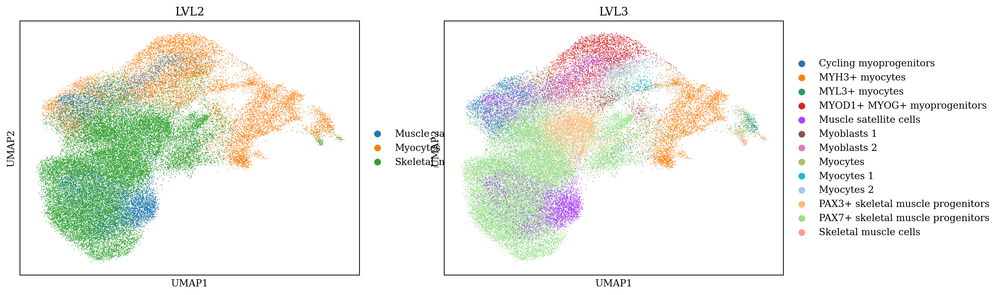

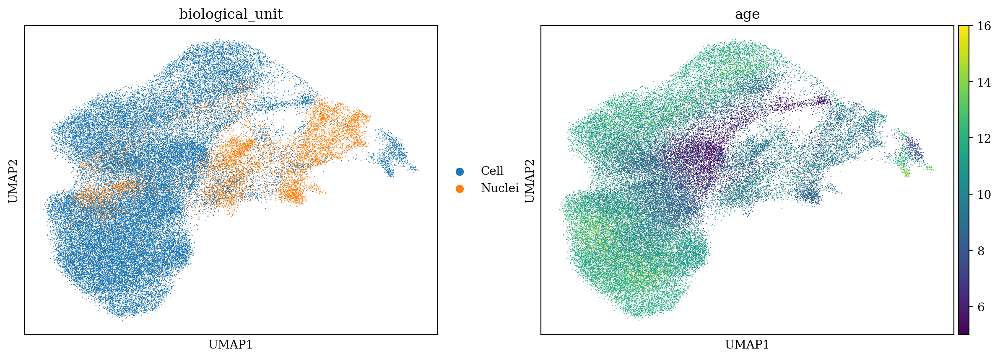

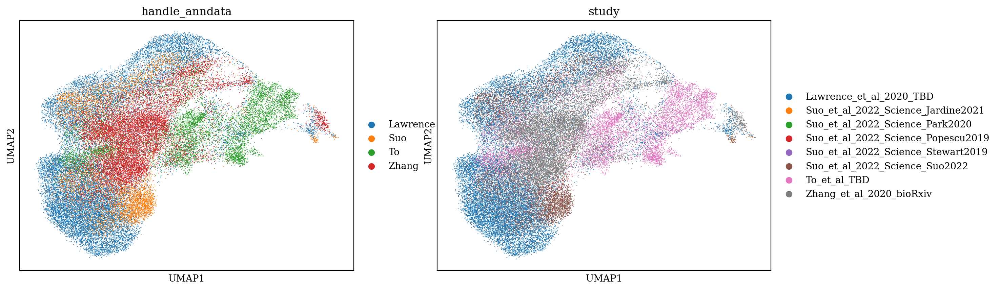

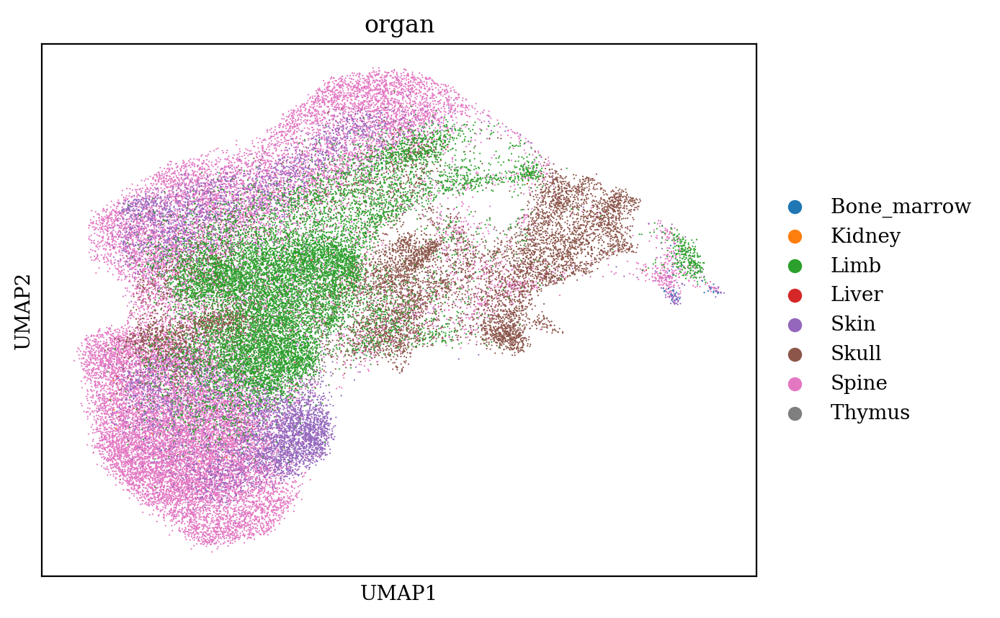

In [209]:
sc.pl.umap(adata, color=['LVL2', 'LVL3'])
sc.pl.umap(adata, color=["biological_unit", "age"])
sc.pl.umap(adata, color=['handle_anndata', 'study'])
sc.pl.umap(adata, color=['organ'])

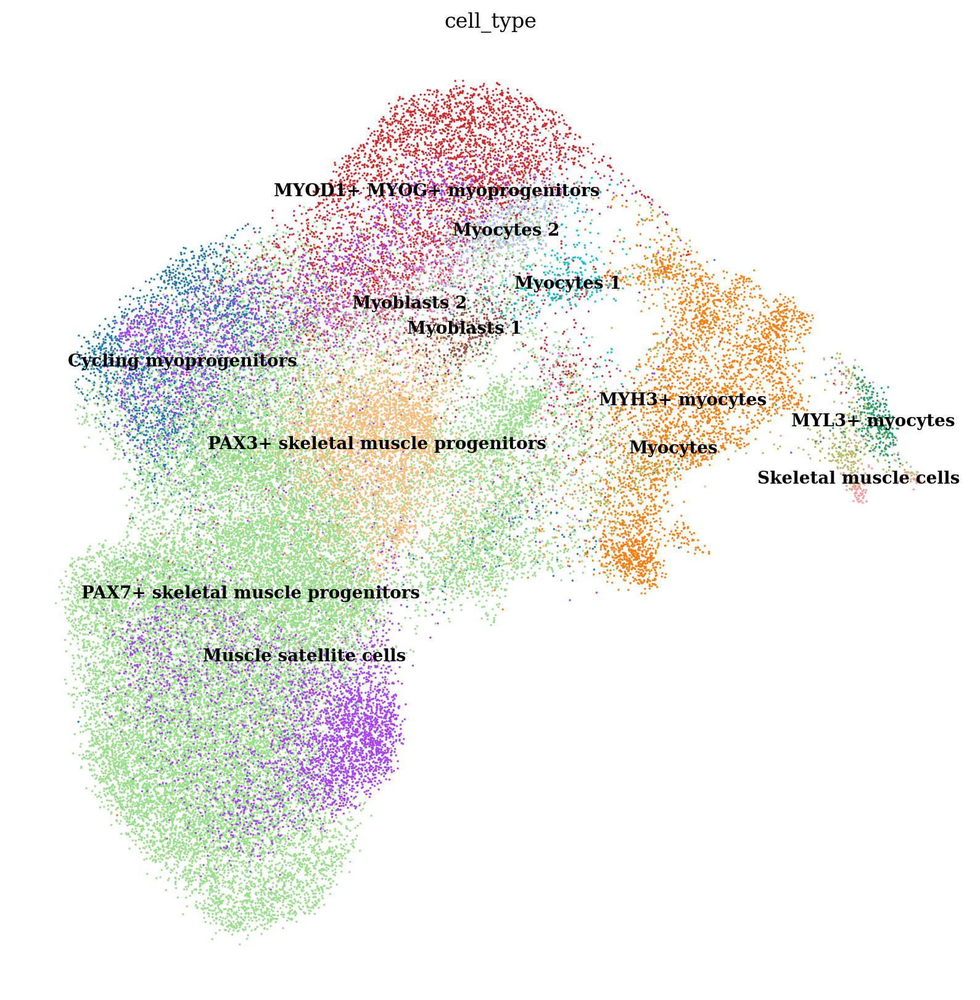

In [193]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
sc.pl.umap(adata, color='cell_type', frameon=False, legend_loc="on data", show=False, ax=ax, size=6)
plt.show()

In [210]:
import cellrank as cr
import scanpy as sc
import scvelo as scv

In [212]:
sc.tl.diffmap(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9860767  0.9747951  0.96870816 0.94925374 0.9433177
     0.9386528  0.9343947  0.9244153  0.9197586  0.91474044 0.90979695
     0.9053819  0.9033851  0.8972146 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:05)


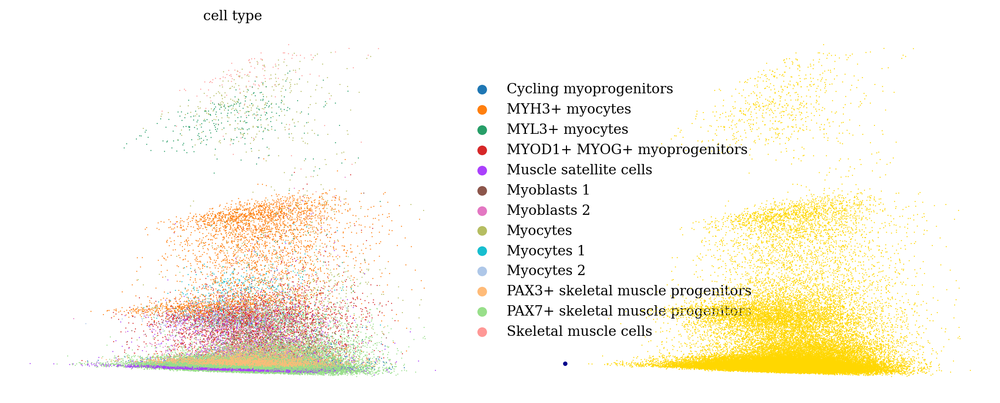

In [219]:
root_ixs = adata.obsm['X_diffmap'][:, 0].argmin()
scv.pl.scatter(
    adata,
    basis="diffmap",
    c=["cell_type", root_ixs],
    legend_loc="right",
    components=["0, 1"],
)

adata.uns["iroot"] = root_ixs

In [220]:
sc.tl.dpt(adata)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


In [228]:
adata.obs.iloc[adata.uns["iroot"]]["cell_type"]

'Muscle satellite cells'

In [222]:
pk = cr.kernels.PseudotimeKernel(adata, time_key="dpt_pseudotime")
pk.compute_transition_matrix()

print(pk)

Computing transition matrix based on pseudotime


  0%|          | 0/49793 [00:00<?, ?cell/s]

    Finish (0:00:14)
PseudotimeKernel[n=49793]


In [ ]:
sc.tl.tsne(adata)

computing tSNE
    using data matrix X directly
    using sklearn.manifold.TSNE


Projecting transition matrix onto `tsne`
Adding `adata.obsm['T_fwd_tsne']`
    Finish (0:00:12)


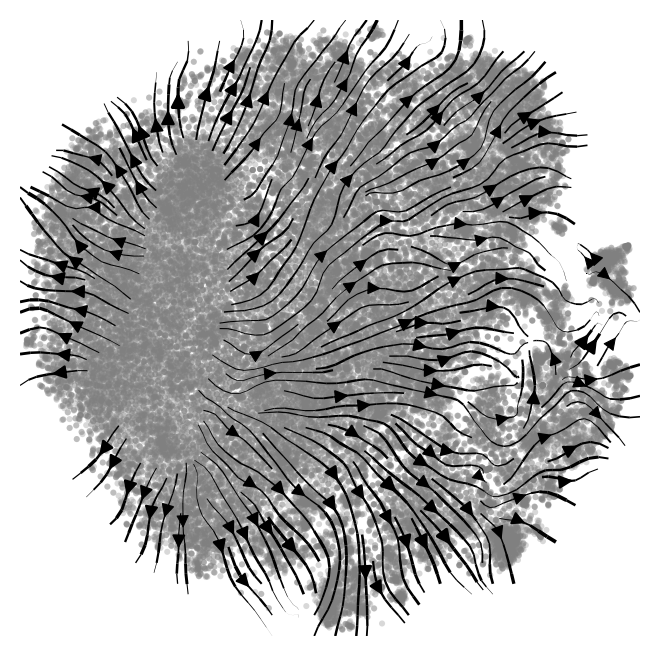

In [252]:
pk.plot_projection(basis="tsne", recompute=True)

In [260]:
list(sorted(adata.obs['cell_type'].unique()))

['Cycling myoprogenitors',
 'MYH3+ myocytes',
 'MYL3+ myocytes',
 'MYOD1+ MYOG+ myoprogenitors',
 'Muscle satellite cells',
 'Myoblasts 1',
 'Myoblasts 2',
 'Myocytes',
 'Myocytes 1',
 'Myocytes 2',
 'PAX3+ skeletal muscle progenitors',
 'PAX7+ skeletal muscle progenitors',
 'Skeletal muscle cells']

In [267]:
adata.obs.groupby(['cell_type','original_author_annotation', 'organ', "handle_anndata"]).apply(len)

cell_type                          original_author_annotation         organ         handle_anndata
Cycling myoprogenitors             CYCLING MYOPROGENITOR              Spine         Lawrence           2124
MYH3+ myocytes                     MYH3+ Myo                          Skull         To                 3397
                                   MYH3+ myocytes                     Limb          Zhang               228
MYL3+ myocytes                     MYL3+ myocytes                     Limb          Zhang               269
MYOD1+ MYOG+ myoprogenitors        MYOD1 MYOG MYOPROGENITOR           Spine         Lawrence           4198
Muscle satellite cells             MUSCLE_SATELLITE                   Bone_marrow   Suo                  15
                                                                      Kidney        Suo                  11
                                                                      Liver         Suo                  74
                                     

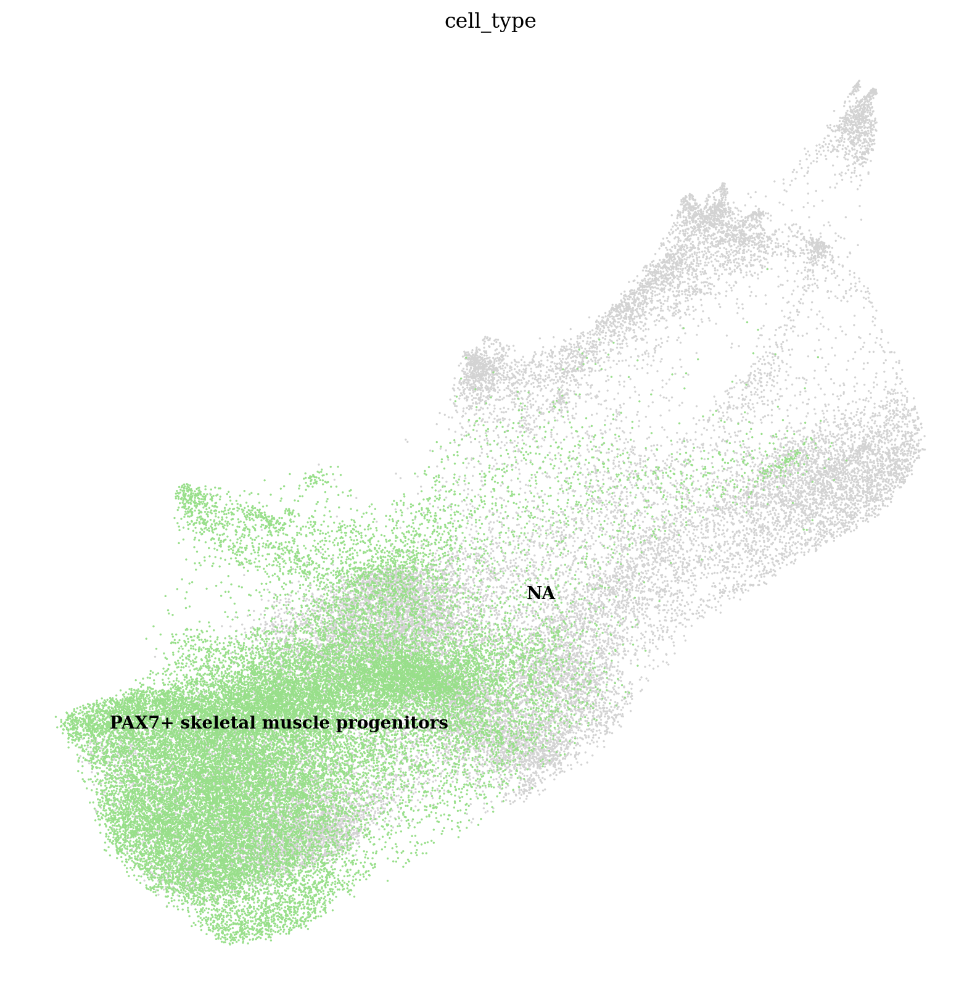

In [268]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
sc.pl.draw_graph(adata, color='cell_type', frameon=False, legend_loc="on data", show=False, ax=ax, size=6, groups=[
    'PAX7+ skeletal muscle progenitors'
                                                                                                                  ])
plt.show()

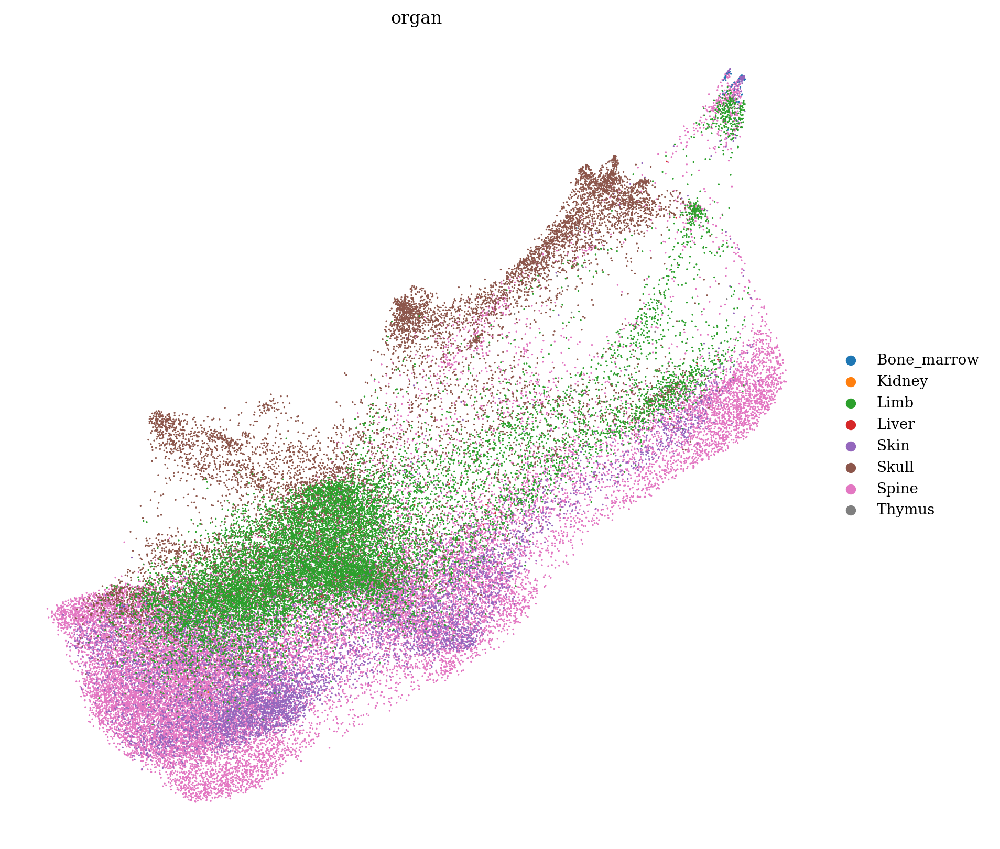

In [258]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
sc.pl.draw_graph(adata, color='organ', frameon=False,show=False, ax=ax, size=6)
plt.show()

In [194]:
paga_inference = PAGAInference(
    random_state=42, neighbors_params={"n_neighbors": 30}, adata=adata, labels=adata.obs["cell_type"]
)
paga_inference.calculate()

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:02)


In [195]:
inferred_trajectories_all = paga_inference.get_result("adjacency")
inferred_trajectories_labels_all = paga_inference.get_result("labels")

In [196]:
cells = dict(
    x1 = "Muscle satellite cells",
    x2 = "Cycling myoprogenitors",
    x3 = "PAX7+ skeletal muscle progenitors",
    x4 = "PAX3+ skeletal muscle progenitors",
    x5 = "Myoblasts 2",
    x6 = "Myoblasts 1",
    x7 = "MYOD1+ MYOG+ myoprogenitors",
    x8 = "Myocytes 2",
    x9 = "Myocytes 1",
    x10 = "Myocytes",
    x11 = "MYL3+ myocytes",
    x12 = "Skeletal muscle cells",
    x13 = "MYH3+ myocytes",
)

In [197]:
ground_truth_trajectories = {
    "trajectory_1": [
        (cells["x1"], cells["x2"]),
        (cells["x2"], cells["x7"]),
        (cells["x7"], cells["x5"]),
        (cells["x5"], cells["x6"]),
        (cells["x6"], cells["x8"]),
        (cells["x8"], cells["x9"]),
        (cells["x9"], cells["x10"]),
    ],
    "trajectory_2": [
        (cells["x2"], cells["x1"]),
        (cells["x1"], cells["x7"]),
        (cells["x7"], cells["x5"]),
        (cells["x5"], cells["x6"]),
        (cells["x6"], cells["x8"]),
        (cells["x8"], cells["x9"]),
        (cells["x9"], cells["x10"]),
    ],
    "trajectory_3": [
        (cells["x7"], cells["x5"]),
        (cells["x5"], cells["x6"]),
        (cells["x6"], cells["x8"]),
        (cells["x8"], cells["x9"]),
        (cells["x9"], cells["x10"]),
    ],
    "trajectory_0": [
        (cells["x4"], cells["x3"]),
        (cells["x3"], cells["x2"]),
        (cells["x1"], cells["x2"]),
        (cells["x2"], cells["x7"]),
        (cells["x7"], cells["x5"]),
        (cells["x5"], cells["x6"]),
        (cells["x6"], cells["x8"]),
        (cells["x8"], cells["x9"]),
        (cells["x9"], cells["x10"]),
        (cells["x10"], cells["x11"]),
        (cells["x11"], cells["x12"]),
        (cells["x12"], cells["x13"]),
        
    ],
}
input_trajectories_all = read_dict(ground_truth_trajectories)
input_trajectories = input_trajectories_all.get_trajectory("trajectory_0", include_additional_nodes=False)

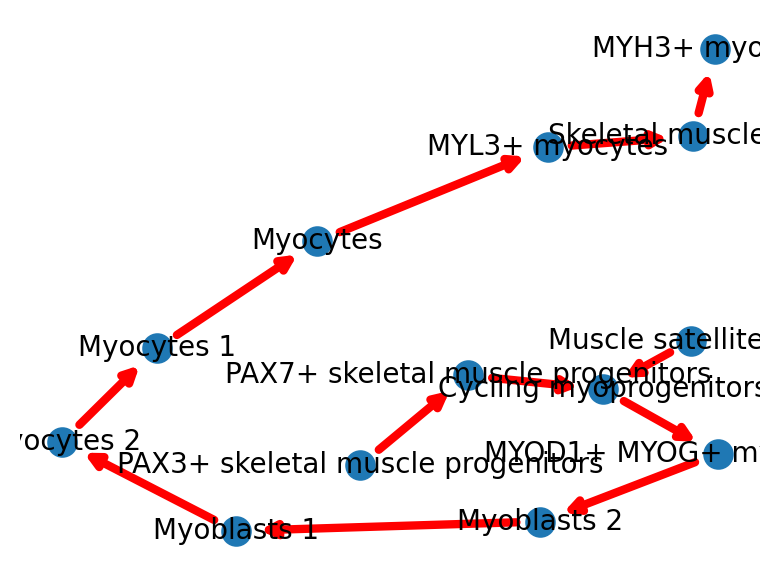

In [198]:
plt.figure(figsize=(4, 3))
pos = nx.spring_layout(input_trajectories)  # positions for all nodes
nx.draw_networkx_nodes(input_trajectories, pos, node_size=100)
for u, v, data in input_trajectories.edges(data=True):
    nx.draw_networkx_edges(input_trajectories, pos, edgelist=[(u, v)], width=3, edge_color="red")
nx.draw_networkx_labels(input_trajectories, pos, font_size=10)
plt.axis("off")
plt.tight_layout()
plt.show()

In [199]:
indices = [ind for ind, i in enumerate(inferred_trajectories_labels_all) if i in list(input_trajectories.nodes)]

In [200]:
inferred_trajectories = inferred_trajectories_all[indices, :][:, indices]
inferred_trajectories_labels = inferred_trajectories_labels_all[indices]

In [201]:
adjacency_evaluation = AdjacencyMatrixEvaluation(
    method_params=dict(
        metrics=[
            "frobenius",
            "L1",
            "accuracy",
            "graph_edit_distance",
            "spectral_distance",
            "jaccard",
            "hamming",
            "precision",
            "recall",
            "f1_score",
            "avg_shortest_path_diff",
            "degree_emd",
            "clustering_coeff_diff",
            "graphlet_degree_vector",
            "weisfeiler_lehman_distance",
            # "gnn_embedding_distance",
            # "persistence_diagram_distance",
            "maximum_common_subgraph_distance",
            "random_walk_kernel_distance",
            # "morans_i",
            # "gearys_c",
            # "local_morans_i",
            # "getis_ord_gi_star",
        ]
    )
)

In [202]:
logging.getLogger().setLevel(logging.DEBUG)
try:
    adjacency_evaluation.evaluate(
        given_trajectory=input_trajectories,
        inferred_trajectory=inferred_trajectories,
        labels=inferred_trajectories_labels,
    )
finally:
    logging.getLogger().setLevel(logging.INFO)

In [203]:
cells

{'x1': 'Muscle satellite cells',
 'x2': 'Cycling myoprogenitors',
 'x3': 'PAX7+ skeletal muscle progenitors',
 'x4': 'PAX3+ skeletal muscle progenitors',
 'x5': 'Myoblasts 2',
 'x6': 'Myoblasts 1',
 'x7': 'MYOD1+ MYOG+ myoprogenitors',
 'x8': 'Myocytes 2',
 'x9': 'Myocytes 1',
 'x10': 'Myocytes',
 'x11': 'MYL3+ myocytes',
 'x12': 'Skeletal muscle cells',
 'x13': 'MYH3+ myocytes'}

In [204]:
(cells["x1"], cells["x3"])
(cells["x3"], cells["x4"])

('PAX7+ skeletal muscle progenitors', 'PAX3+ skeletal muscle progenitors')

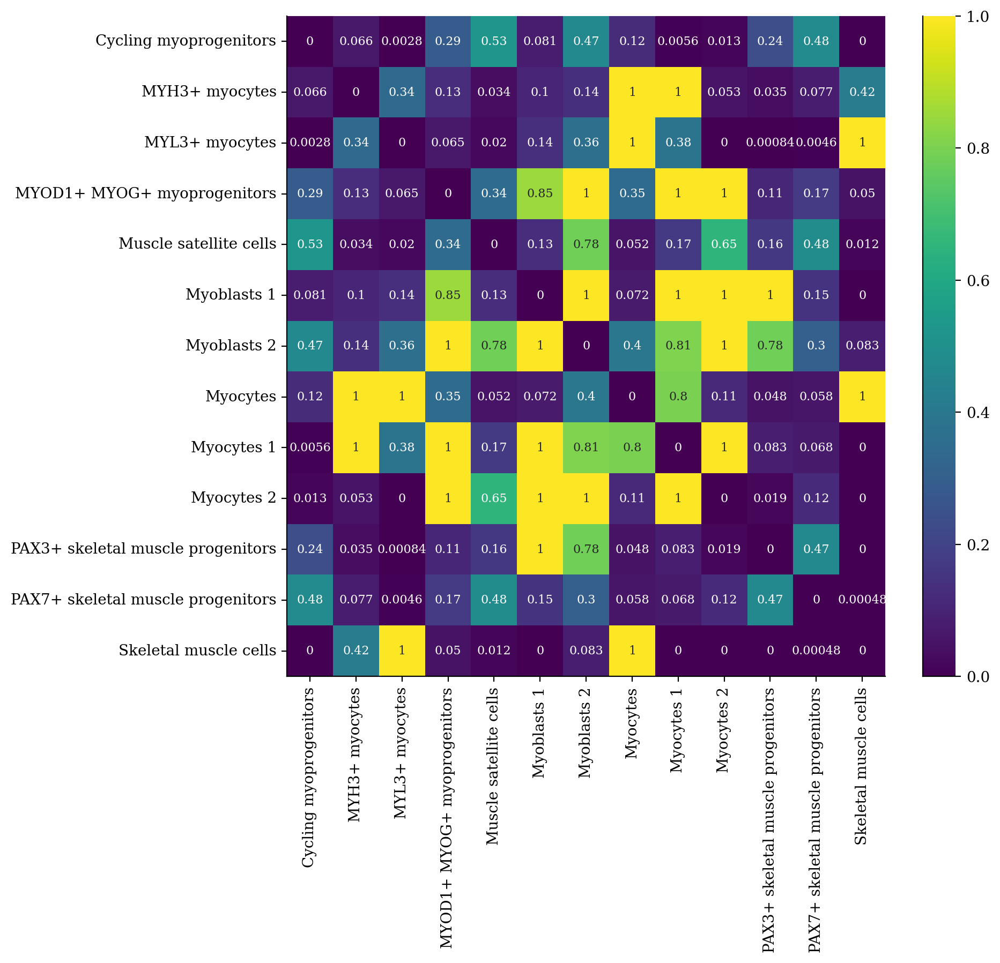

In [205]:
plt.figure(figsize=(9, 8))
sns.heatmap(adjacency_evaluation.prepared_after_subset_inferred, cmap="viridis", annot=True, annot_kws={"fontsize": 8},
           xticklabels=inferred_trajectories_labels, yticklabels=inferred_trajectories_labels)
sns.despine()
plt.show()

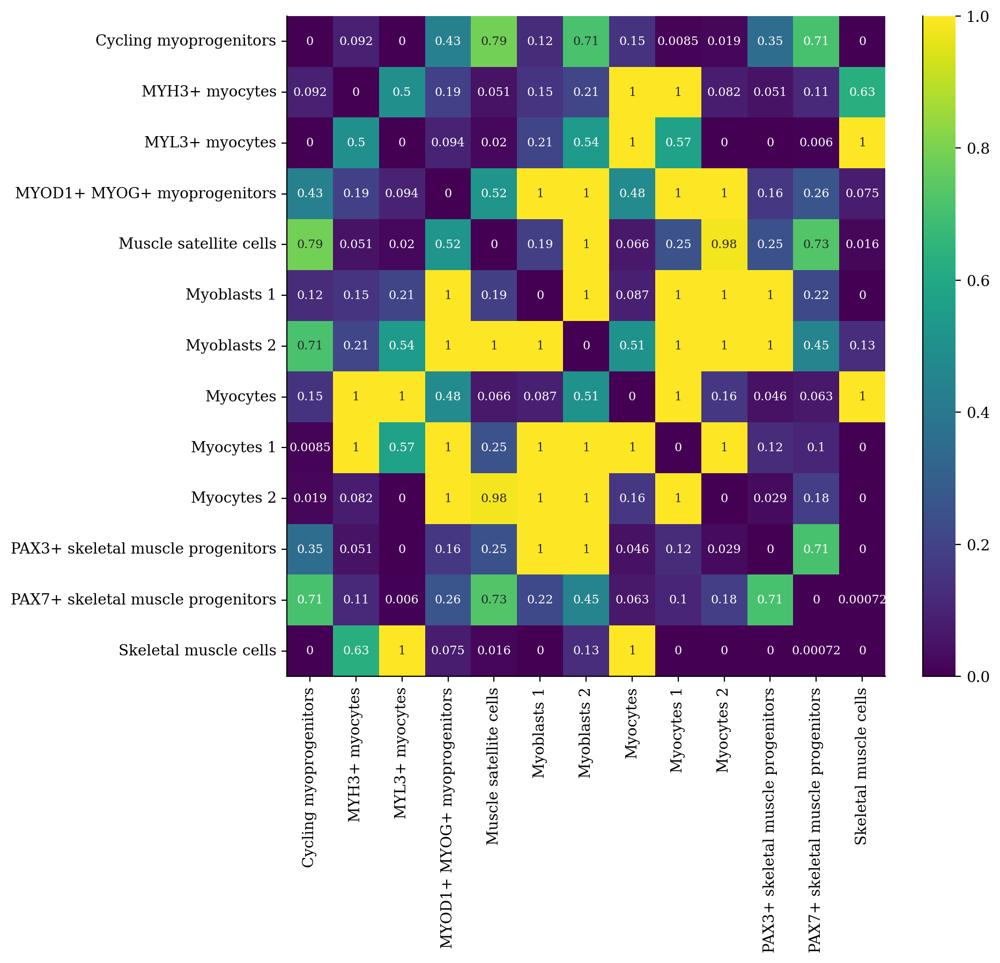

In [177]:
# plt.figure(figsize=(5, 4))
# sns.heatmap(adjacency_evaluation.prepared_after_subset_given, cmap="viridis", annot=True, annot_kws={"fontsize": 8},
#            xticklabels=inferred_trajectories_labels, yticklabels=inferred_trajectories_labels)
# sns.despine()
# plt.show()

In [206]:
adjacency_evaluation.get_result()

{'frobenius': 5.3636237038929195,
 'L1': 42.60899484292563,
 'accuracy': 0.21893491124260356,
 'graph_edit_distance': 60.0,
 'spectral_distance': 3.3342796386052362,
 'jaccard': 0.16666666666666666,
 'hamming': 132,
 'precision': 0.42857142857142855,
 'recall': 0.5,
 'f1_score': 0.4615384615384615,
 'avg_shortest_path_diff': 3.3589743589743595,
 'degree_emd': 2.3466828162426308,
 'clustering_coeff_diff': 0.9468531468531468,
 'graphlet_degree_vector': 0.03125,
 'weisfeiler_lehman_distance': 1325513202,
 'maximum_common_subgraph_distance': 84,
 'random_walk_kernel_distance': 0.4254661023163253}

In [165]:
adjacency_evaluation.get_result()

{'frobenius': 4.3796973966436274,
 'L1': 23.700695478630198,
 'accuracy': 0.28125,
 'graph_edit_distance': 21.0,
 'spectral_distance': 3.283885844761412,
 'jaccard': 0.25,
 'hamming': 46,
 'precision': 0.4166666666666667,
 'recall': 0.7142857142857143,
 'f1_score': 0.5263157894736842,
 'avg_shortest_path_diff': 2.0,
 'degree_emd': 2.6165955137467494,
 'clustering_coeff_diff': 1.0,
 'graphlet_degree_vector': 0.03125,
 'weisfeiler_lehman_distance': 618524180,
 'maximum_common_subgraph_distance': 35,
 'random_walk_kernel_distance': 0.38860290204238934}